In [1]:
import matplotlib.pyplot as plt

# Set the font to Bookman
plt.rcParams['font.family'] = 'Bookman'

# EDA Techniques: Sleep Health Lifestyle Dataset

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import pandas as pd

In [3]:
import pandas as pd
sleep_data = pd.read_csv('data.csv')
sleep_data

,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder
0,1,Male,27,Software Engineer,6.1,6,42,6,Overweight,126/83,77,4200,None
1,2,Male,28,Doctor,6.2,6,60,8,Normal,125/80,75,10000,None
2,3,Male,28,Doctor,6.2,6,60,8,Normal,125/80,75,10000,None
3,4,Male,28,Sales Representative,5.9,4,30,8,Obese,140/90,85,3000,Sleep Apnea
4,5,Male,28,Sales Representative,5.9,4,30,8,Obese,140/90,85,3000,Sleep Apnea
...,...,...,...,...,...,...,...,...,...,...,...,...,...
369,370,Female,59,Nurse,8.1,9,75,3,Overweight,140/95,68,7000,Sleep Apnea
370,371,Female,59,Nurse,8.0,9,75,3,Overweight,140/95,68,7000,Sleep Apnea
371,372,Female,59,Nurse,8.1,9,75,3,Overweight,140/95,68,7000,Sleep Apnea
372,373,Female,59,Nurse,8.1,9,75,3,Overweight,140/95,68,7000,Sleep Apnea


In [4]:
sleep_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374 entries, 0 to 373
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Person ID                374 non-null    int64  
 1   Gender                   374 non-null    object 
 2   Age                      374 non-null    int64  
 3   Occupation               374 non-null    object 
 4   Sleep Duration           374 non-null    float64
 5   Quality of Sleep         374 non-null    int64  
 6   Physical Activity Level  374 non-null    int64  
 7   Stress Level             374 non-null    int64  
 8   BMI Category             374 non-null    object 
 9   Blood Pressure           374 non-null    object 
 10  Heart Rate               374 non-null    int64  
 11  Daily Steps              374 non-null    int64  
 12  Sleep Disorder           374 non-null    object 
dtypes: float64(1), int64(7), object(5)
memory usage: 38.1+ KB


In [5]:
sleep_data.describe(include='all')

,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder
count,374.000000,374,374.000000,374,374.000000,374.000000,374.000000,374.000000,374,374,374.000000,374.000000,374
unique,NaN,2,NaN,11,NaN,NaN,NaN,NaN,4,25,NaN,NaN,3
top,NaN,Male,NaN,Nurse,NaN,NaN,NaN,NaN,Normal,130/85,NaN,NaN,None
freq,NaN,189,NaN,73,NaN,NaN,NaN,NaN,195,99,NaN,NaN,219
mean,187.500000,NaN,42.184492,NaN,7.132086,7.312834,59.171123,5.385027,NaN,NaN,70.165775,6816.844920,NaN
std,108.108742,NaN,8.673133,NaN,0.795657,1.196956,20.830804,1.774526,NaN,NaN,4.135676,1617.915679,NaN
min,1.000000,NaN,27.000000,NaN,5.800000,4.000000,30.000000,3.000000,NaN,NaN,65.000000,3000.000000,NaN
25%,94.250000,NaN,35.250000,NaN,6.400000,6.000000,45.000000,4.000000,NaN,NaN,68.000000,5600.000000,NaN
50%,187.500000,NaN,43.000000,NaN,7.200000,7.000000,60.000000,5.000000,NaN,NaN,70.000000,7000.000000,NaN
75%,280.750000,NaN,50.000000,NaN,7.800000,8.000000,75.000000,7.000000,NaN,NaN,72.000000,8000.000000,NaN


## Univariate Analysis

### Summary Stats, Skewness, Kurtosis

In [6]:
from IPython.display import display

summary_stats = sleep_data.describe().T
summary_stats['mode'] = sleep_data.mode().iloc[0]
summary_stats['variance'] = sleep_data.var()
summary_stats

,count,mean,std,min,25%,50%,75%,max,mode,variance
Person ID,374.0,187.500000,108.108742,1.0,94.25,187.5,280.75,374.0,1,1.168750e+04
Age,374.0,42.184492,8.673133,27.0,35.25,43.0,50.00,59.0,43.0,7.522324e+01
Sleep Duration,374.0,7.132086,0.795657,5.8,6.40,7.2,7.80,8.5,7.2,6.330696e-01
Quality of Sleep,374.0,7.312834,1.196956,4.0,6.00,7.0,8.00,9.0,8.0,1.432703e+00
Physical Activity Level,374.0,59.171123,20.830804,30.0,45.00,60.0,75.00,90.0,60.0,4.339224e+02
Stress Level,374.0,5.385027,1.774526,3.0,4.00,5.0,7.00,8.0,3.0,3.148944e+00
Heart Rate,374.0,70.165775,4.135676,65.0,68.00,70.0,72.00,86.0,68.0,1.710381e+01
Daily Steps,374.0,6816.844920,1617.915679,3000.0,5600.00,7000.0,8000.00,10000.0,8000.0,2.617651e+06


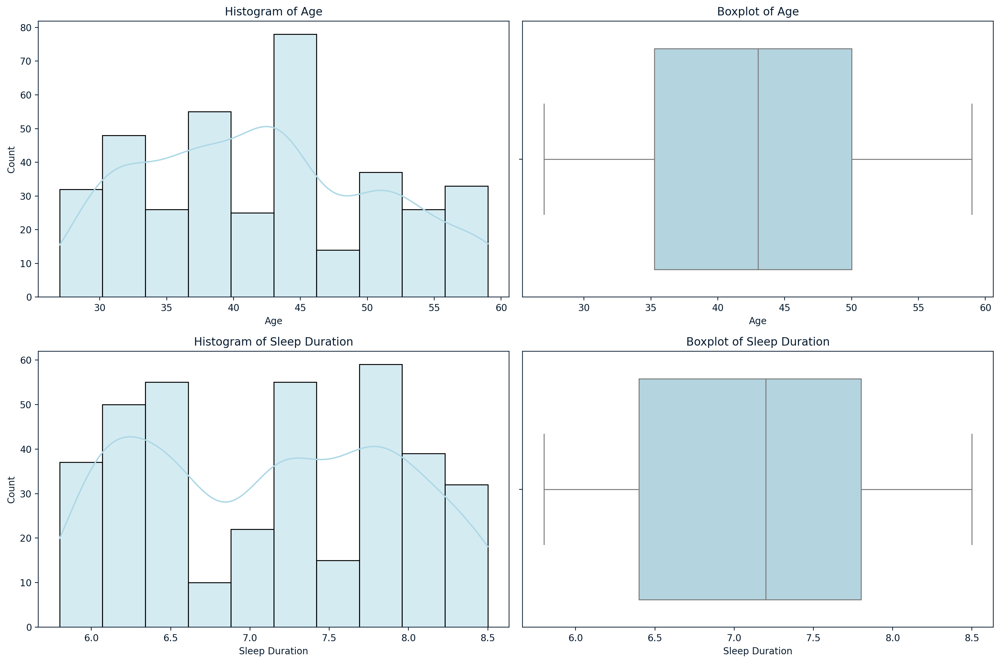

In [7]:
# numerical columns to plot
numerical_columns = ["Age", "Sleep Duration"]

fig, axes = plt.subplots(len(numerical_columns), 2, figsize=(15, 5 * len(numerical_columns)))

# loop for each numerical column and create a histogram and boxplot
for i, column in enumerate(numerical_columns):
    # hist
    sns.histplot(sleep_data[column], kde=True, ax=axes[i, 0], color='lightblue')
    axes[i, 0].set_title(f'Histogram of {column}')
    
    # boxplot
    sns.boxplot(x=sleep_data[column], ax=axes[i, 1], color='lightblue')
    axes[i, 1].set_title(f'Boxplot of {column}')

# layout
plt.tight_layout()
plt.show()

## Bivariate Analysis

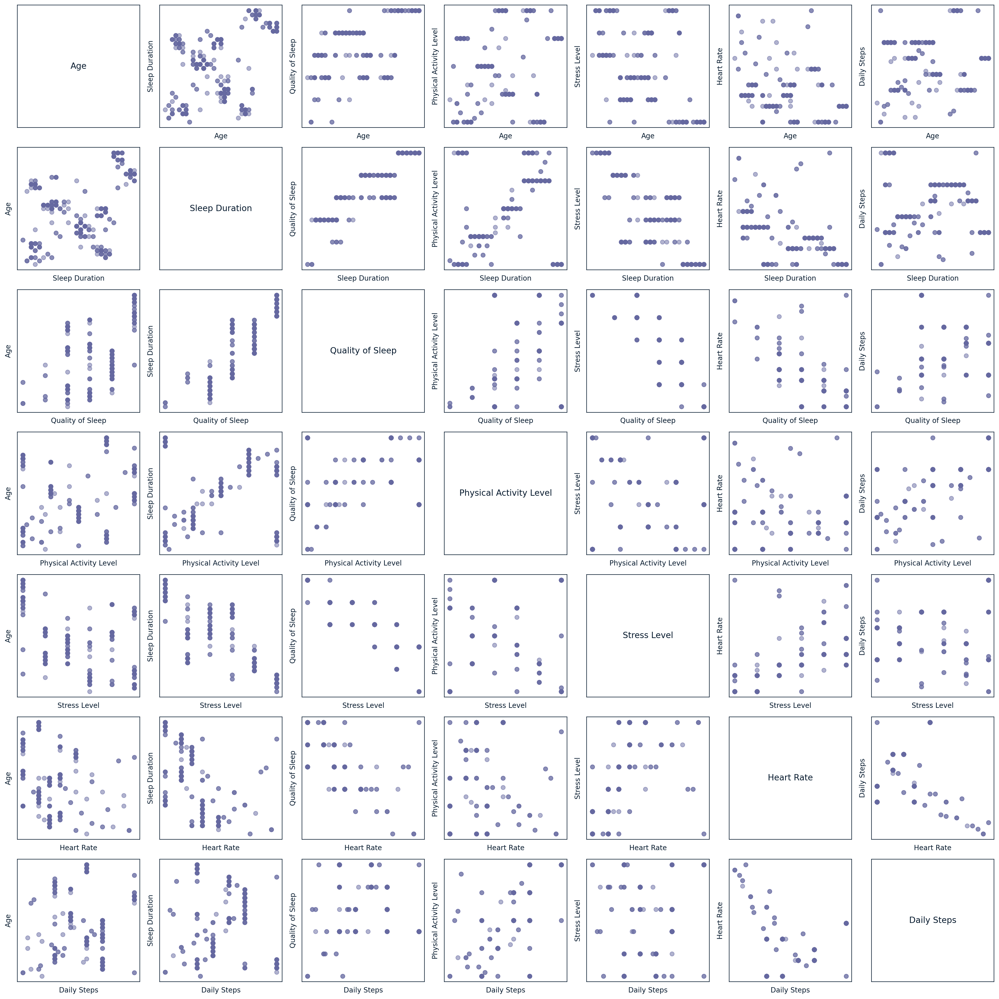

                              Age  Sleep Duration  ...  Heart Rate  Daily Steps
Age                      1.000000        0.344709  ...   -0.225606     0.057973
Sleep Duration           0.344709        1.000000  ...   -0.516455    -0.039533
Quality of Sleep         0.473734        0.883213  ...   -0.659865     0.016791
Physical Activity Level  0.178993        0.212360  ...    0.136971     0.772723
Stress Level            -0.422344       -0.811023  ...    0.670026     0.186829
Heart Rate              -0.225606       -0.516455  ...    1.000000    -0.030309
Daily Steps              0.057973       -0.039533  ...   -0.030309     1.000000

[7 rows x 7 columns]


In [9]:
# Bivariate Analysis

# Scatter plots to assess the correlation between numerical variables
numerical_columns = ["Age", "Sleep Duration", "Quality of Sleep", "Physical Activity Level", "Stress Level", "Heart Rate", "Daily Steps"]

fig, axes = plt.subplots(len(numerical_columns), len(numerical_columns), figsize=(20, 20))

for i, col1 in enumerate(numerical_columns):
    for j, col2 in enumerate(numerical_columns):
        if i != j:
            axes[i, j].scatter(sleep_data[col1], sleep_data[col2], alpha=0.5)
            axes[i, j].set_xlabel(col1)
            axes[i, j].set_ylabel(col2)
        else:
            axes[i, j].text(0.5, 0.5, col1, horizontalalignment='center', verticalalignment='center', fontsize=12)
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])

plt.tight_layout()
plt.show()

# correlation coefficients and interpret them
correlation_matrix = sleep_data[numerical_columns].corr()
print(correlation_matrix)

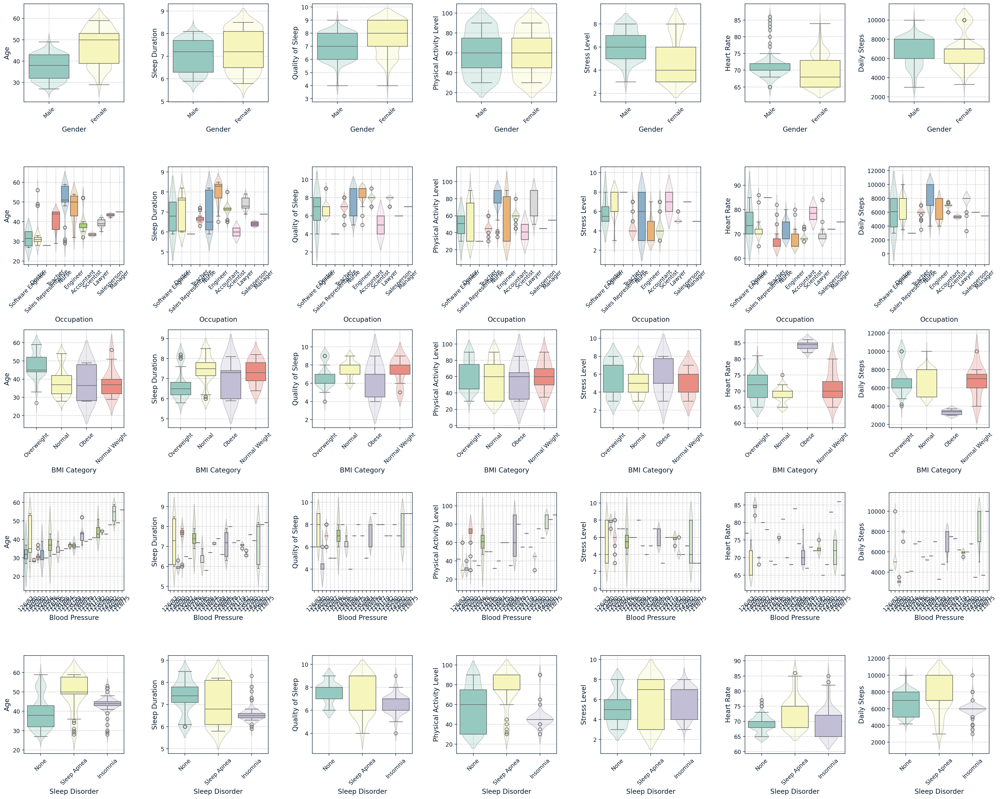

In [10]:
# boxplot and violin plots for Categorical vs. Numerical Data

import seaborn as sns

# Define categorical and numerical columns
categorical_columns = ["Gender", "Occupation", "BMI Category", "Blood Pressure", "Sleep Disorder"]
numerical_columns = ["Age", "Sleep Duration", "Quality of Sleep", "Physical Activity Level", "Stress Level", "Heart Rate", "Daily Steps"]

# Create boxplots
fig, axes = plt.subplots(len(categorical_columns), len(numerical_columns), figsize=(25, 20))

for i, cat_col in enumerate(categorical_columns):
    for j, num_col in enumerate(numerical_columns):
        sns.boxplot(x=sleep_data[cat_col], y=sleep_data[num_col], ax=axes[i, j], palette="Set3")
        sns.violinplot(x=sleep_data[cat_col], y=sleep_data[num_col], ax=axes[i, j], palette="Set3", inner=None, alpha=0.3)
        axes[i, j].set_xlabel(cat_col, fontsize=12)
        axes[i, j].set_ylabel(num_col, fontsize=12)
        axes[i, j].tick_params(axis='x', rotation=45)
        axes[i, j].tick_params(axis='both', which='major', labelsize=10)
        axes[i, j].grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

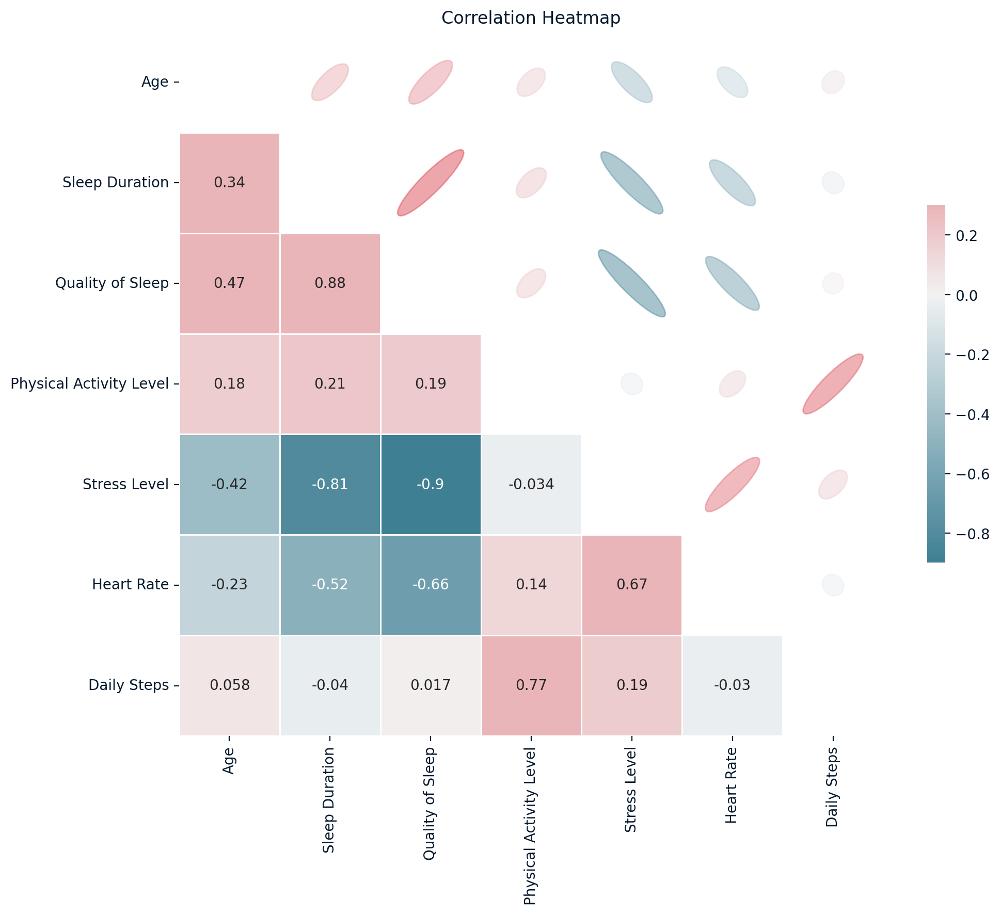

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

f, ax = plt.subplots(figsize=(11, 9))

# custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

# ellipses to denote the distribution along the line
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = correlation_matrix.iloc[i, j]
        norm = plt.Normalize(vmin=-1, vmax=1)
        ellipse_color = cmap(norm(corr_value))
        ellipse_width = 0.2 + abs(corr_value) * 0.8
        ellipse_height = 0.2
        ellipse_angle = 45 if corr_value < 0 else -45
        ellipse = plt.matplotlib.patches.Ellipse((j+0.5, i+0.5), width=ellipse_width, height=ellipse_height, angle=ellipse_angle, color=ellipse_color, alpha=0.5)
        ax.add_patch(ellipse)

plt.title('Correlation Heatmap')
plt.show()

## Multivariate Analysis

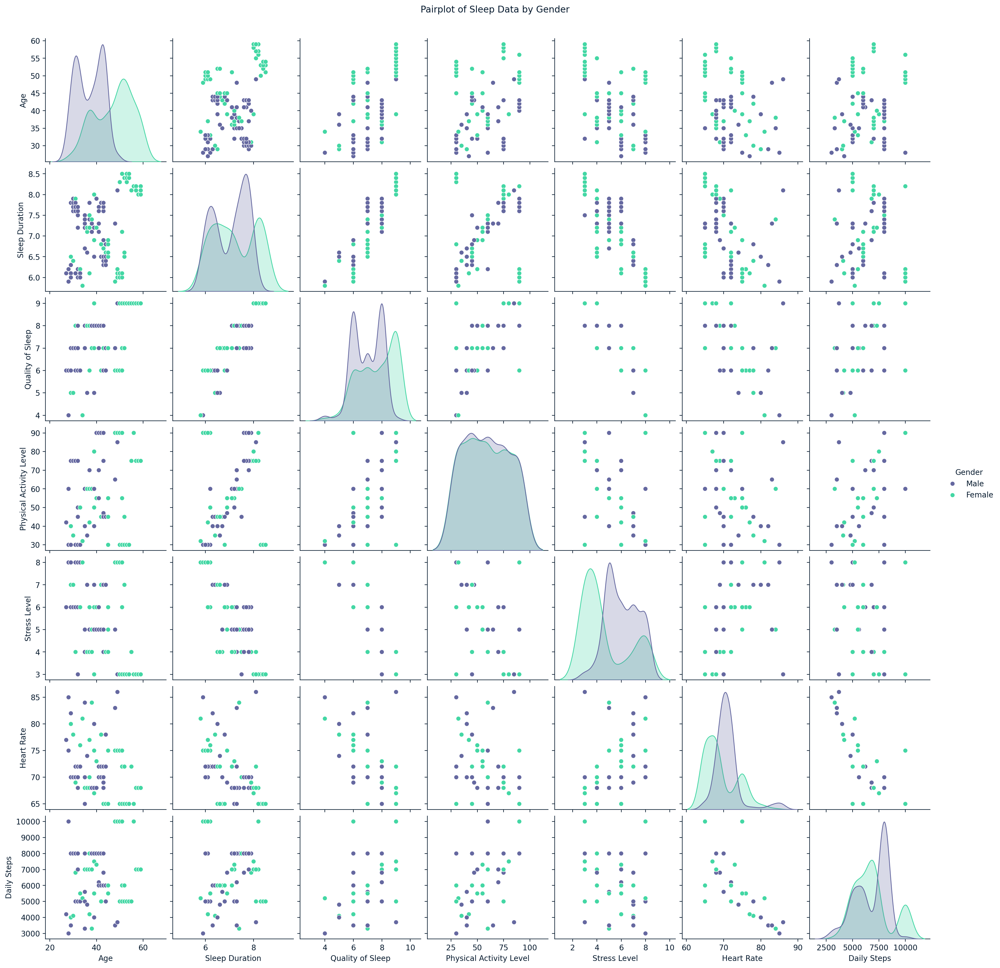

In [12]:
# 3d scatter
sns.pairplot(sleep_data, hue='Gender', vars=['Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level', 'Stress Level', 'Heart Rate', 'Daily Steps'])
plt.suptitle('Pairplot of Sleep Data by Gender', y=1.02)
plt.show()

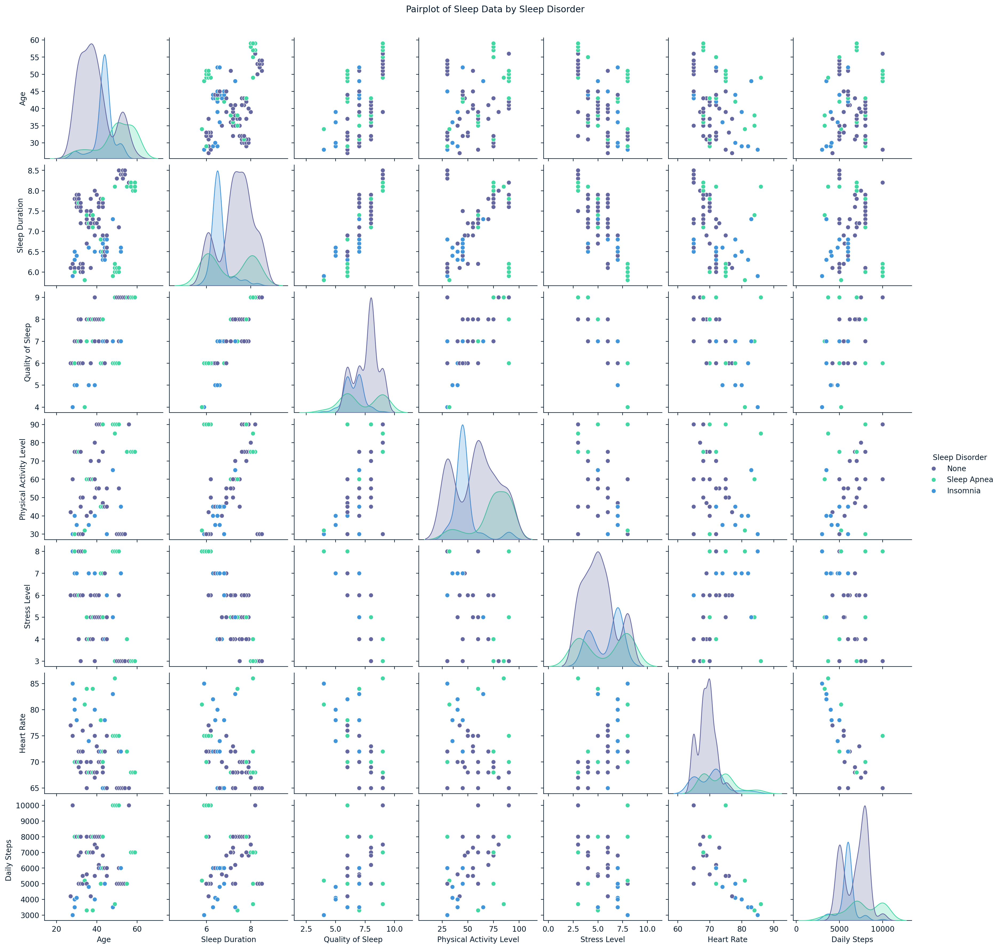

In [13]:
# 3d scatter
sns.pairplot(sleep_data, hue='Sleep Disorder', vars=['Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level', 'Stress Level', 'Heart Rate', 'Daily Steps'])
plt.suptitle('Pairplot of Sleep Data by Sleep Disorder', y=1.02)
plt.show()

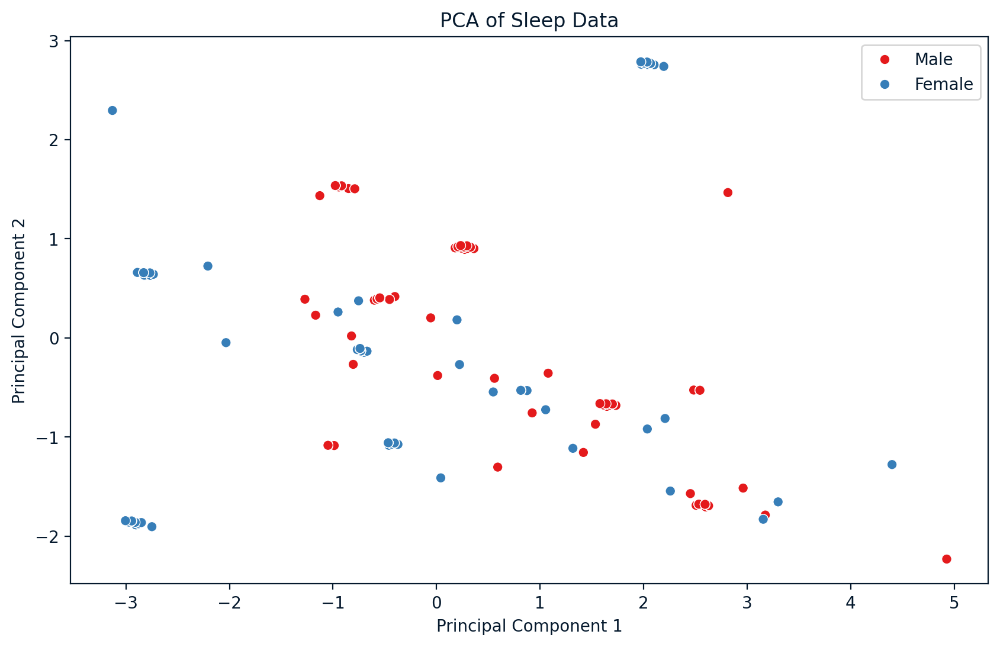

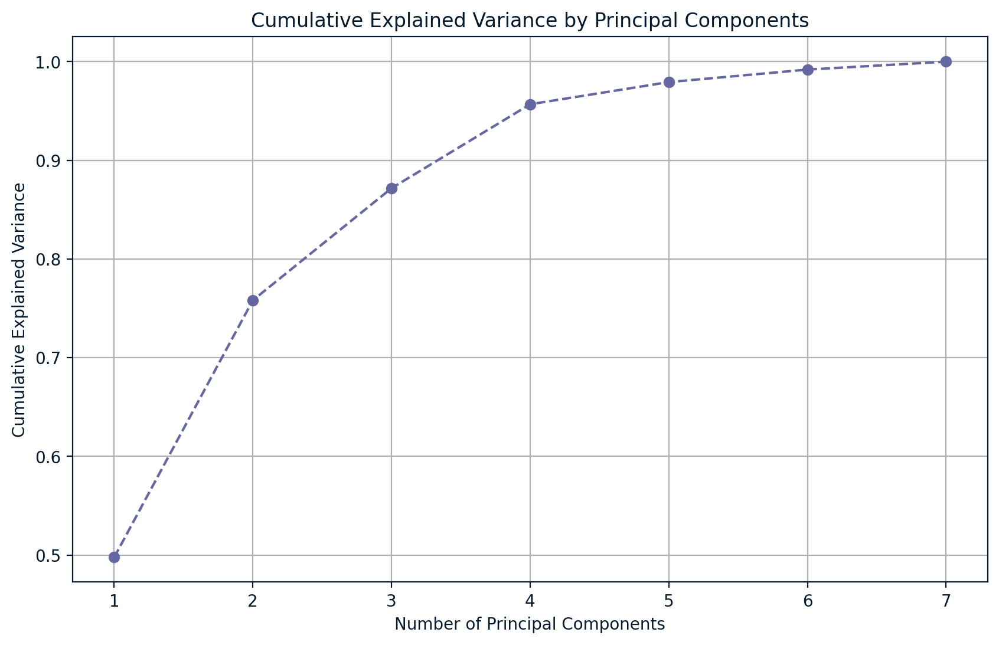

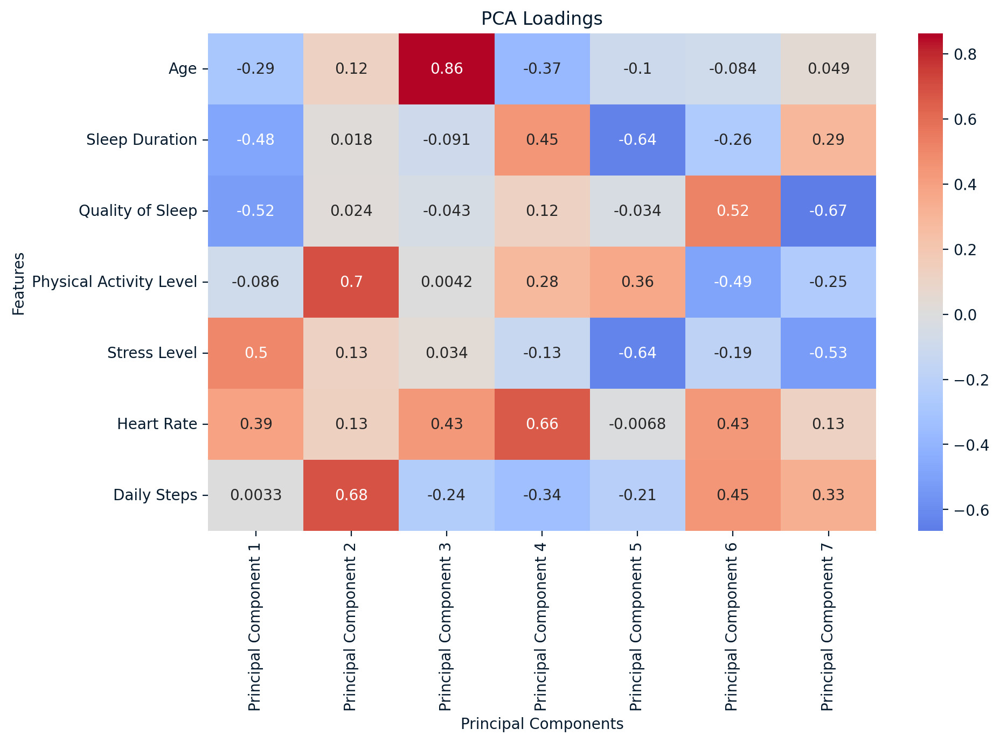

In [14]:
# preparation
pca_features = ['Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level', 'Stress Level', 'Heart Rate', 'Daily Steps']
X = sleep_data[pca_features].dropna()

# standarization 
X_standardized = (X - X.mean()) / X.std()

# PCA
pca = PCA(n_components=len(pca_features))
principal_components = pca.fit_transform(X_standardized)
pca_df = pd.DataFrame(data=principal_components, columns=[f'Principal Component {i+1}' for i in range(len(pca_features))])

# concat with the categorical variable
pca_df = pd.concat([pca_df, sleep_data[['Gender']].reset_index(drop=True)], axis=1)

# plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Principal Component 1', y='Principal Component 2', hue='Gender', data=pca_df, palette='Set1')
plt.title('PCA of Sleep Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

# explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance)

# cumulative explained variance plot
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_explained_variance) + 1))
plt.grid()
plt.show()

# explainability 
loadings = pd.DataFrame(pca.components_.T, columns=[f'Principal Component {i+1}' for i in range(len(pca_features))], index=pca_features)
plt.figure(figsize=(10, 6))
sns.heatmap(loadings, annot=True, cmap='coolwarm', center=0)
plt.title('PCA Loadings')
plt.xlabel('Principal Components')
plt.ylabel('Features')
plt.show()

The explained variance tells us how much information (variance) can be attributed to each of the principal components. In this case, Principal Component 1 explains 50% of the variance in the data, and Principal Component 2 explains 26% of the variance. This means that together, these two components account for 76% of the total variance in the dataset. 

## Categorical Data Analysis

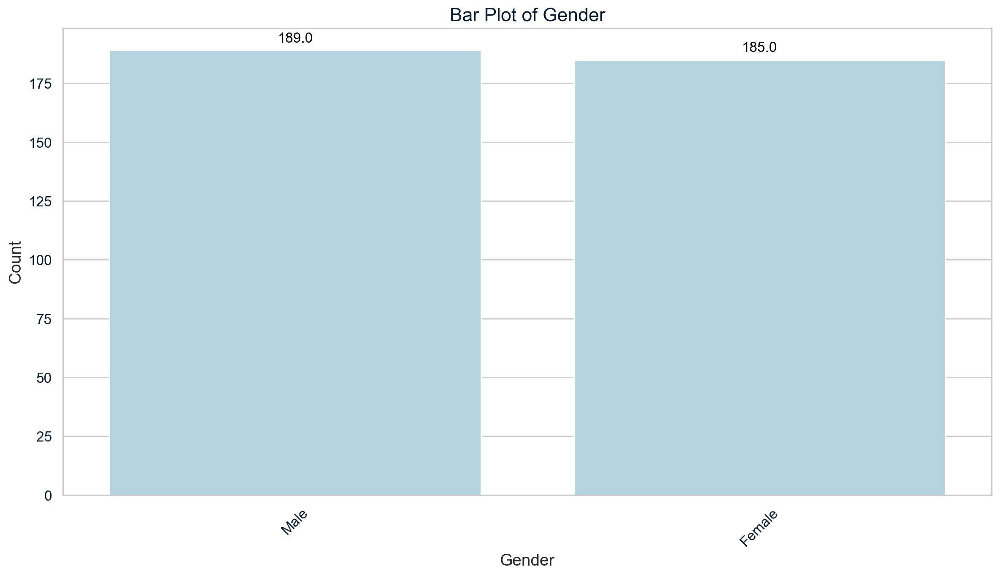

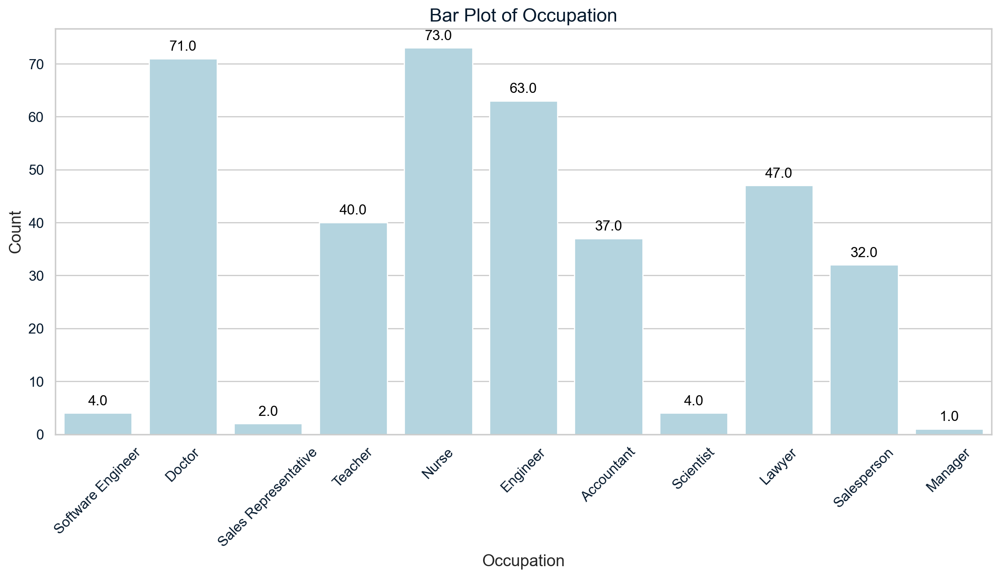

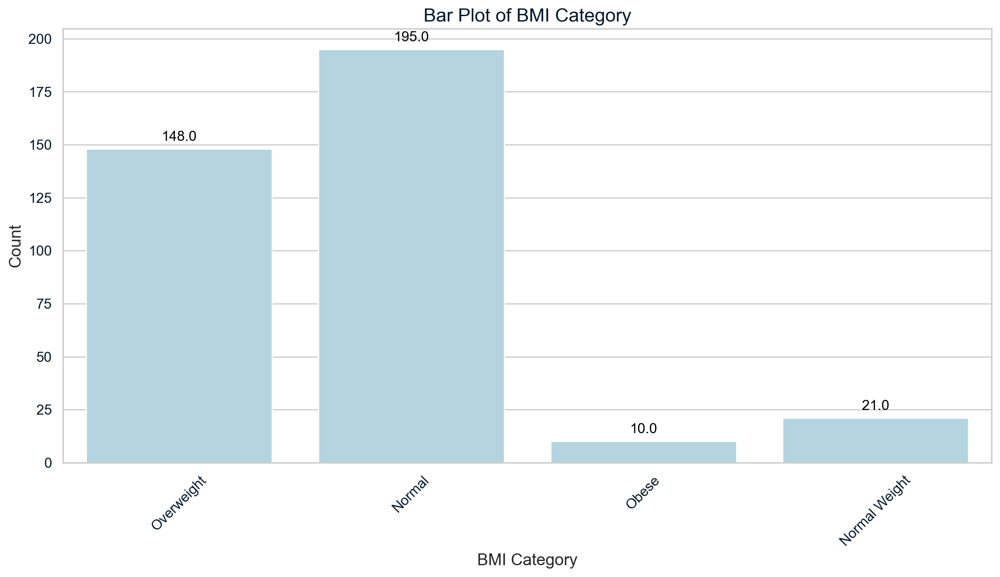

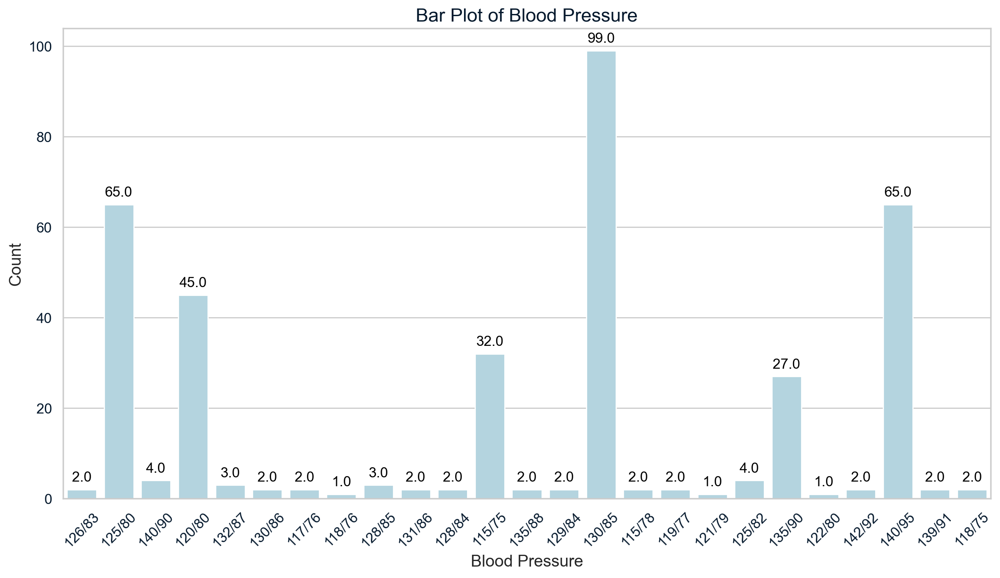

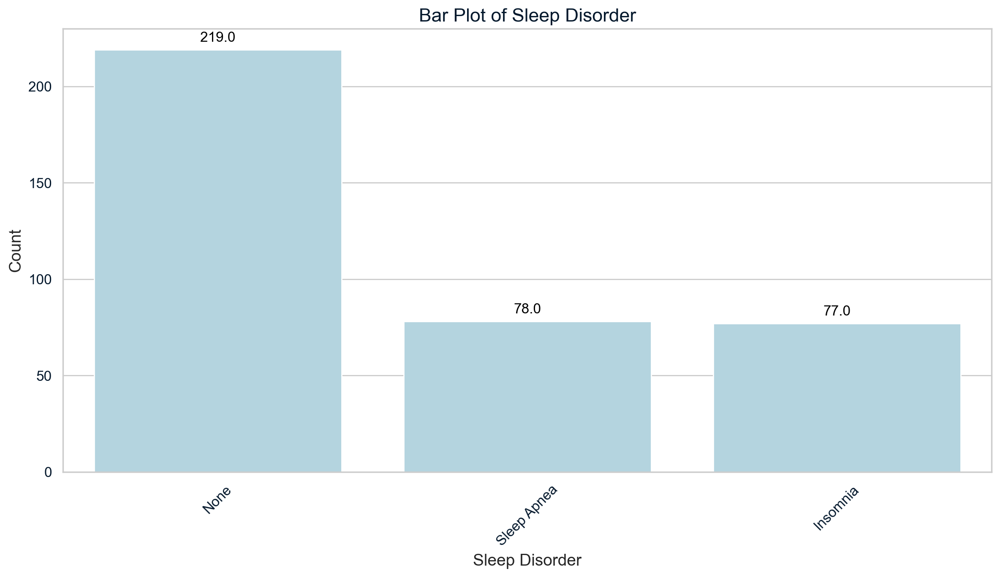

In [21]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# Frequency tables for categorical variables
categorical_columns = ['Gender', 'Occupation', 'BMI Category', 'Blood Pressure', 'Sleep Disorder']
frequency_tables = {col: sleep_data[col].value_counts() for col in categorical_columns}

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Visualize categories using bar plots
for col in categorical_columns:
    plt.figure(figsize=(12, 7))
    ax = sns.countplot(data=sleep_data, x=col, color="lightblue")
    plt.title(f'Bar Plot of {col}', fontsize=16)
    plt.xlabel(col, fontsize=14)
    plt.ylabel('Count', fontsize=14)
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)
    
    # Add counts above the bars
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', fontsize=12, color='black', xytext=(0, 10), 
                    textcoords='offset points')
    
    plt.tight_layout()
    plt.show()

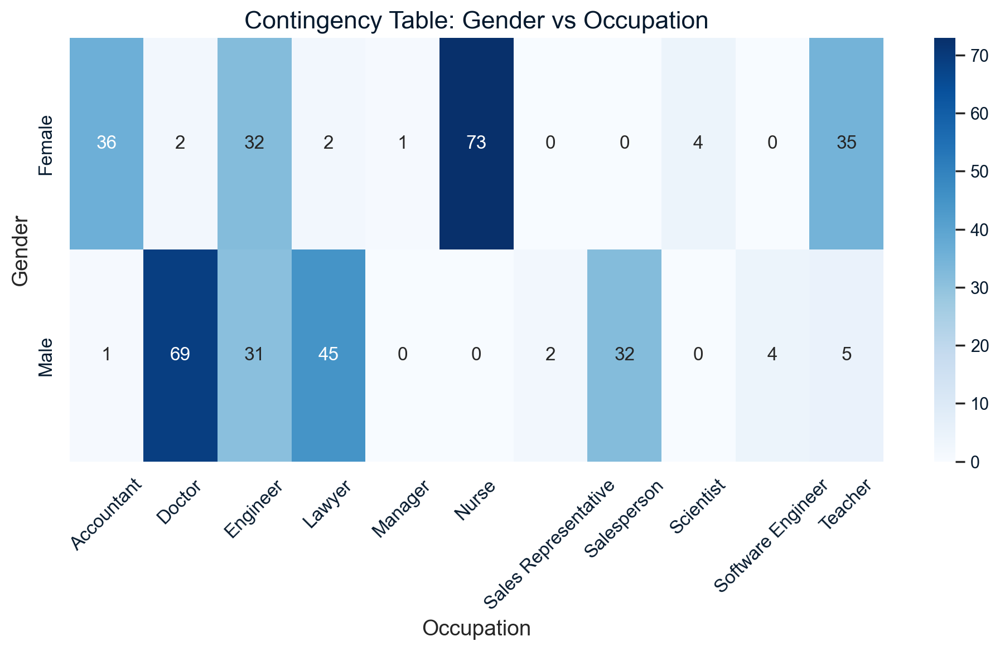

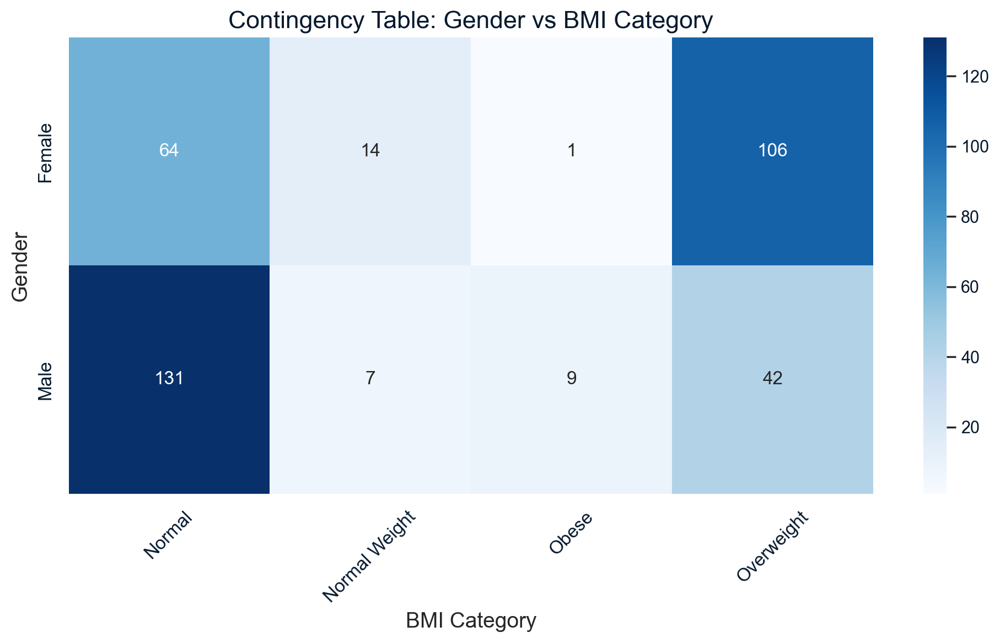

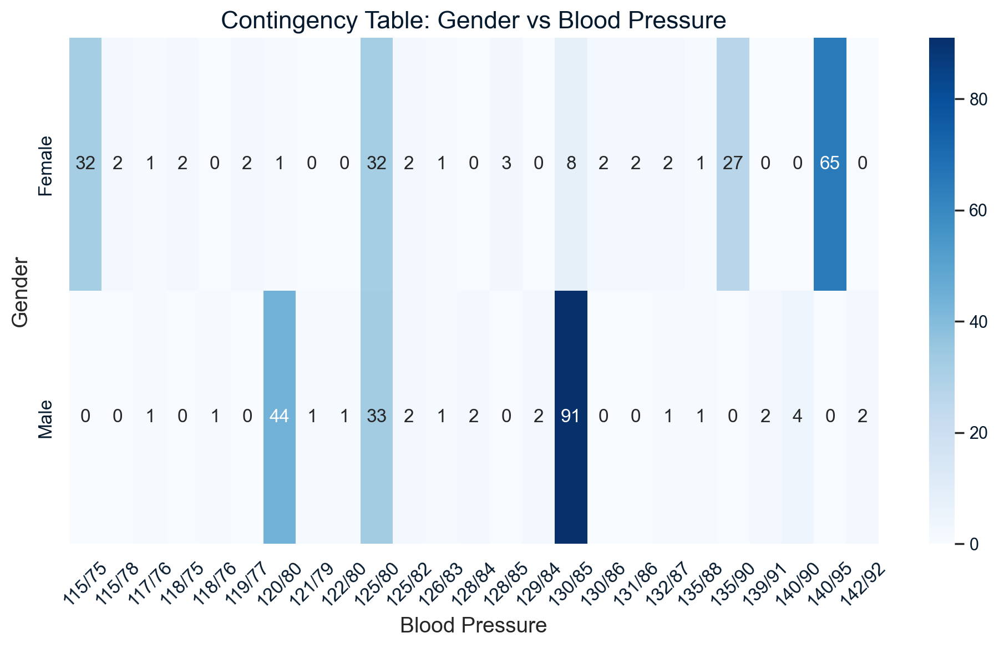

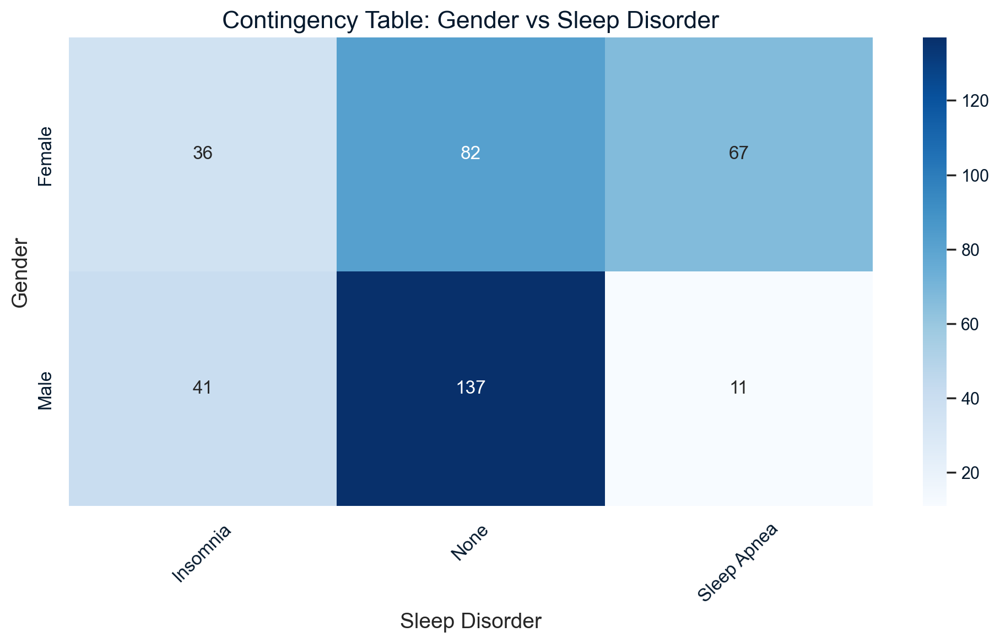

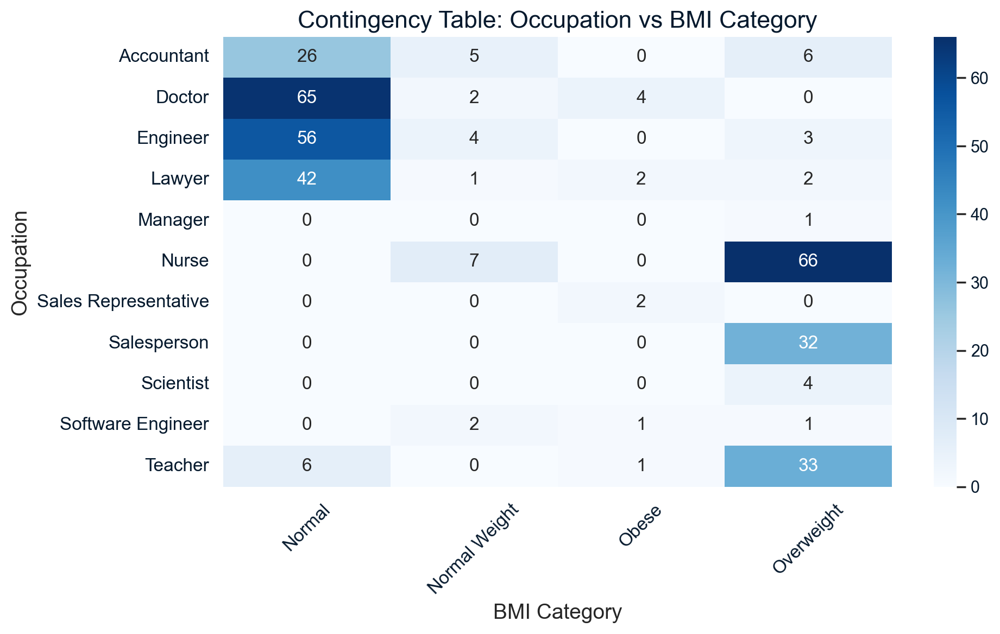

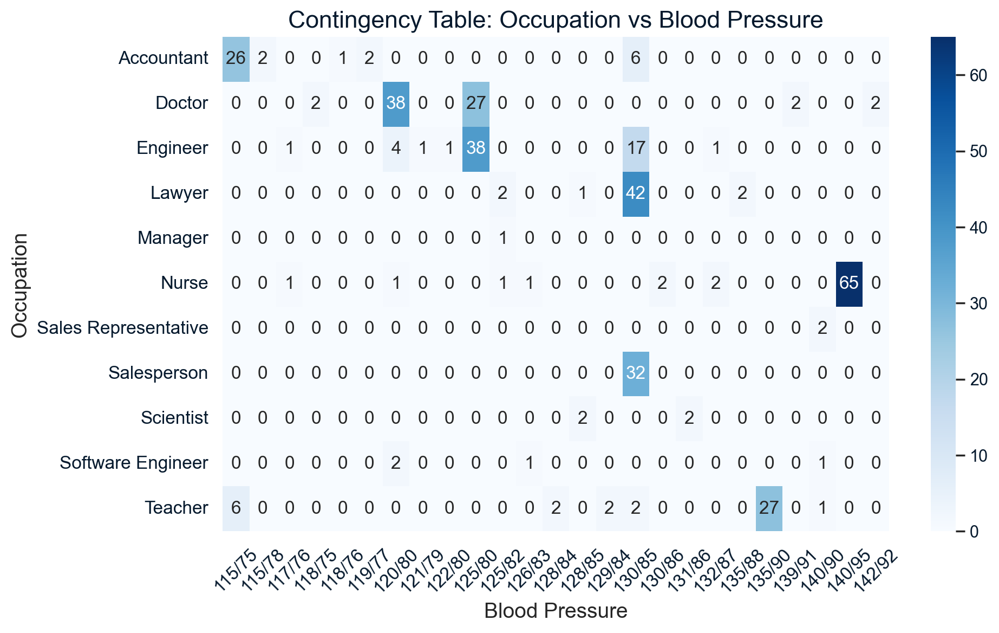

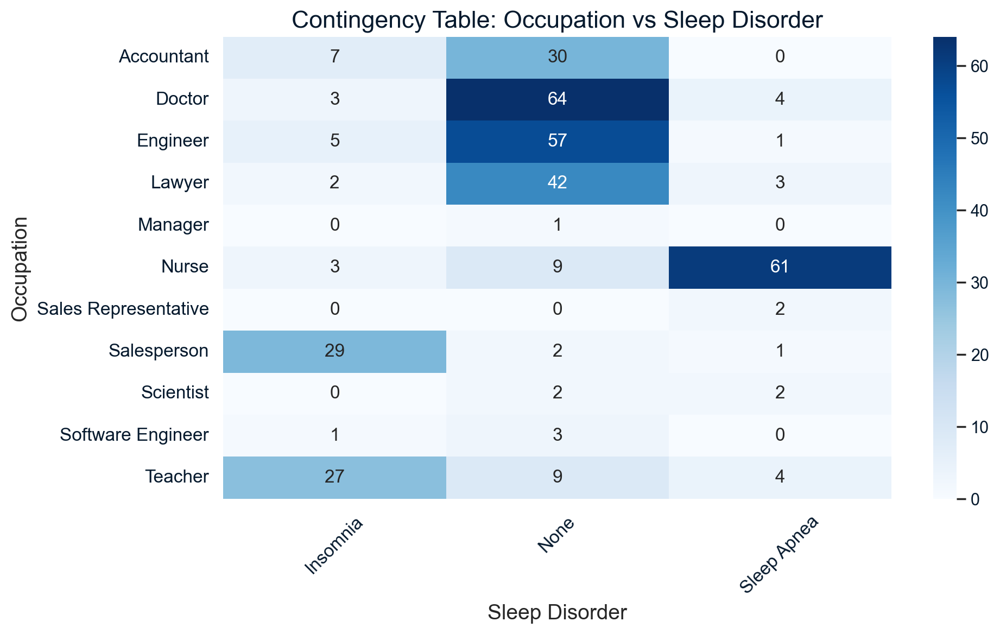

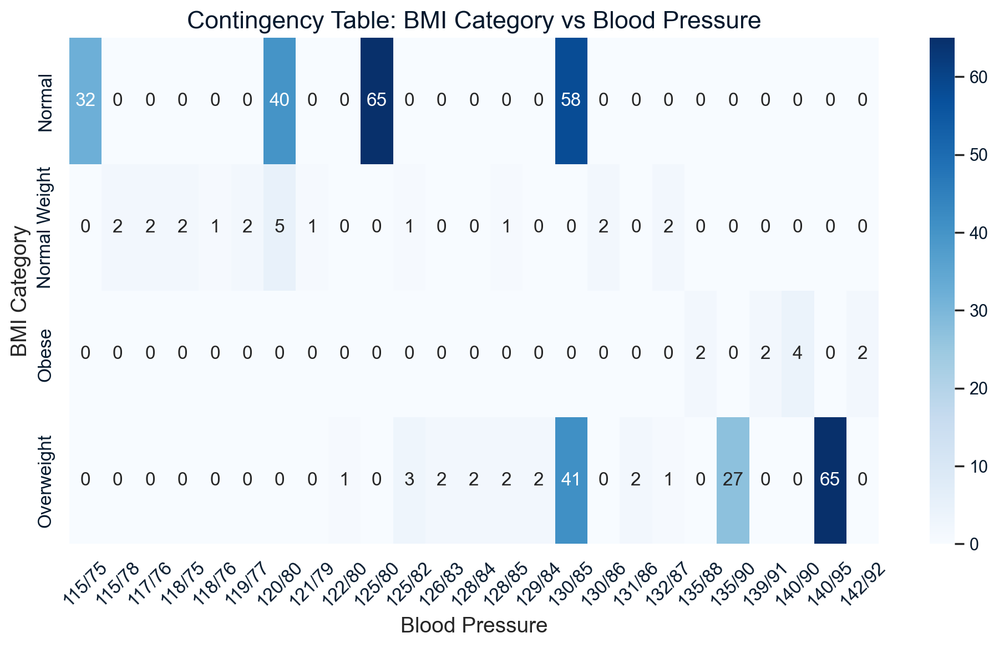

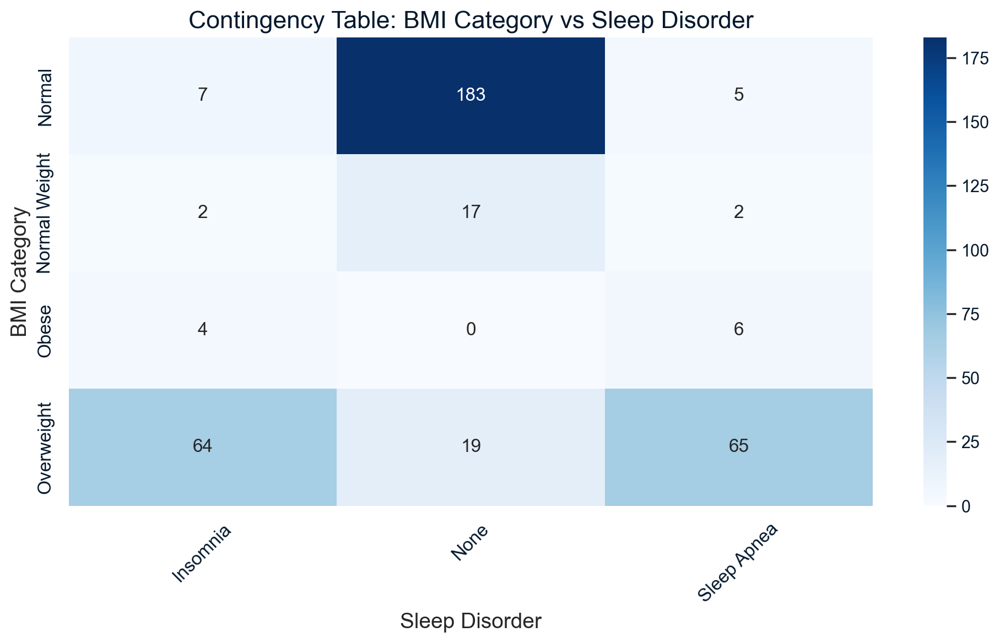

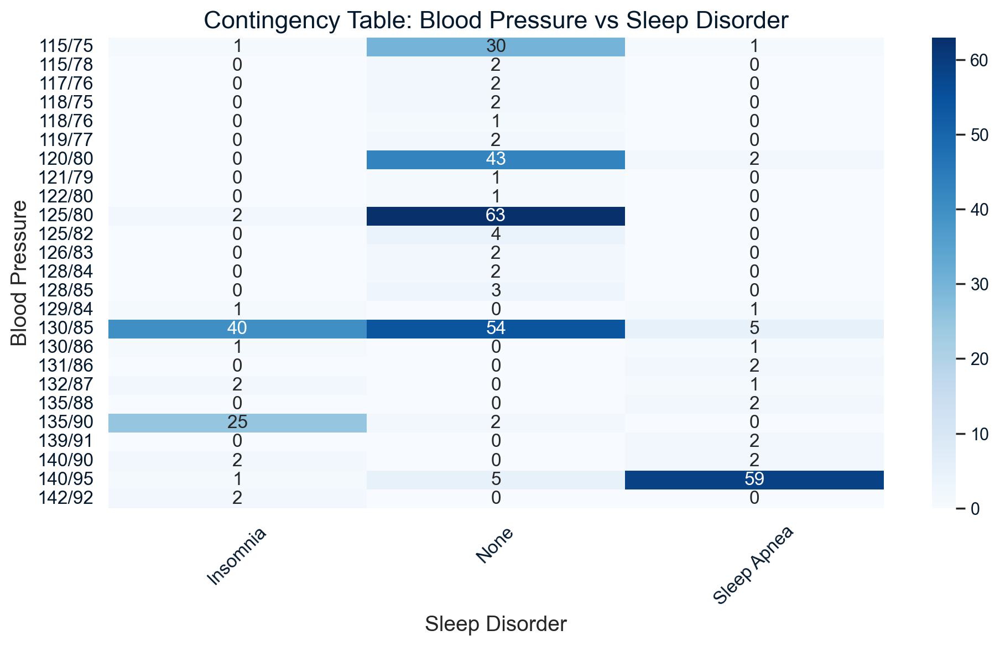

In [25]:
# Chi-Square tests for independence between categorical variables and visualize the results
chi2_results = {}
categorical_columns = ['Gender', 'Occupation', 'BMI Category', 'Blood Pressure', 'Sleep Disorder']

for i in range(len(categorical_columns)):
    for j in range(i + 1, len(categorical_columns)):
        col1 = categorical_columns[i]
        col2 = categorical_columns[j]
        
        # contingency table
        contingency_table = pd.crosstab(sleep_data[col1], sleep_data[col2])
        
        # Chi-Square test
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        
        # store results
        chi2_results[f'{col1} vs {col2}'] = {'chi2': chi2, 'p-value': p, 'dof': dof, 'expected': expected}
        
        # plot the contingency table
        plt.figure(figsize=(10, 6))
        sns.heatmap(contingency_table, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Contingency Table: {col1} vs {col2}', fontsize=16)
        plt.xlabel(col2, fontsize=14)
        plt.ylabel(col1, fontsize=14)
        plt.xticks(rotation=45, fontsize=12)
        plt.yticks(fontsize=12)
        plt.tight_layout()
        plt.show()

In [27]:
# Chi-Square test results as a table with interpretation
chi2_results_df = pd.DataFrame.from_dict(chi2_results, orient='index')
chi2_results_df['Interpretation'] = chi2_results_df['p-value'].apply(lambda p: 'Significant' if p < 0.05 else 'Not Significant')

chi2_results_df

,chi2,p-value,dof,expected,Interpretation
Gender vs Occupation,274.178340,4.400429e-53,10,"[[18.302139037433154, 35.12032085561497, 31.16...",Significant
Gender vs BMI Category,59.393535,7.921424e-13,3,"[[96.4572192513369, 10.38770053475936, 4.94652...",Significant
Gender vs Blood Pressure,263.010770,4.293132e-42,24,"[[15.828877005347593, 0.9893048128342246, 0.98...",Significant
Gender vs Sleep Disorder,54.306020,1.612863e-12,2,"[[38.088235294117645, 108.3288770053476, 38.58...",Significant
Occupation vs BMI Category,405.509053,2.152345e-67,30,"[[19.29144385026738, 2.0775401069518717, 0.989...",Significant
Occupation vs Blood Pressure,1941.104982,1.820527e-263,240,"[[3.165775401069519, 0.19786096256684493, 0.19...",Significant
Occupation vs Sleep Disorder,421.362755,7.481314e-77,20,"[[7.617647058823529, 21.665775401069517, 7.716...",Significant
BMI Category vs Blood Pressure,885.185315,2.606469e-140,72,"[[16.684491978609625, 1.0427807486631016, 1.04...",Significant
BMI Category vs Sleep Disorder,246.968163,1.822932e-50,6,"[[40.14705882352941, 114.18449197860963, 40.66...",Significant
Blood Pressure vs Sleep Disorder,453.152760,2.528247e-67,48,"[[6.588235294117647, 18.737967914438503, 6.673...",Significant


## Missing Data Analysis

In [29]:
import numpy as np

# copy of the original sleep_data dataframe
sleep_data_with_missing = sleep_data.copy()

# introduce missing values in some numerical columns
np.random.seed(42)  # For reproducibility

# where we want to introduce missing values
columns_with_missing = ["Sleep Duration", "Quality of Sleep", "Physical Activity Level", "Stress Level", "Heart Rate", "Daily Steps"]

# Introduce missing values in 10% of the rows for each selected column
for column in columns_with_missing:
    missing_indices = np.random.choice(sleep_data_with_missing.index, size=int(0.1 * len(sleep_data_with_missing)), replace=False)
    sleep_data_with_missing.loc[missing_indices, column] = np.nan

sleep_data_with_missing

,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder
0,1,Male,27,Software Engineer,NaN,6.0,42.0,6.0,Overweight,126/83,77.0,4200.0,None
1,2,Male,28,Doctor,6.2,6.0,60.0,8.0,Normal,125/80,75.0,10000.0,None
2,3,Male,28,Doctor,6.2,6.0,60.0,8.0,Normal,125/80,75.0,10000.0,None
3,4,Male,28,Sales Representative,5.9,4.0,30.0,8.0,Obese,140/90,85.0,3000.0,Sleep Apnea
4,5,Male,28,Sales Representative,5.9,4.0,30.0,8.0,Obese,140/90,85.0,3000.0,Sleep Apnea
...,...,...,...,...,...,...,...,...,...,...,...,...,...
369,370,Female,59,Nurse,8.1,9.0,75.0,3.0,Overweight,140/95,68.0,7000.0,Sleep Apnea
370,371,Female,59,Nurse,NaN,9.0,NaN,3.0,Overweight,140/95,68.0,7000.0,Sleep Apnea
371,372,Female,59,Nurse,8.1,9.0,NaN,3.0,Overweight,140/95,68.0,7000.0,Sleep Apnea
372,373,Female,59,Nurse,8.1,9.0,75.0,3.0,Overweight,140/95,68.0,7000.0,Sleep Apnea


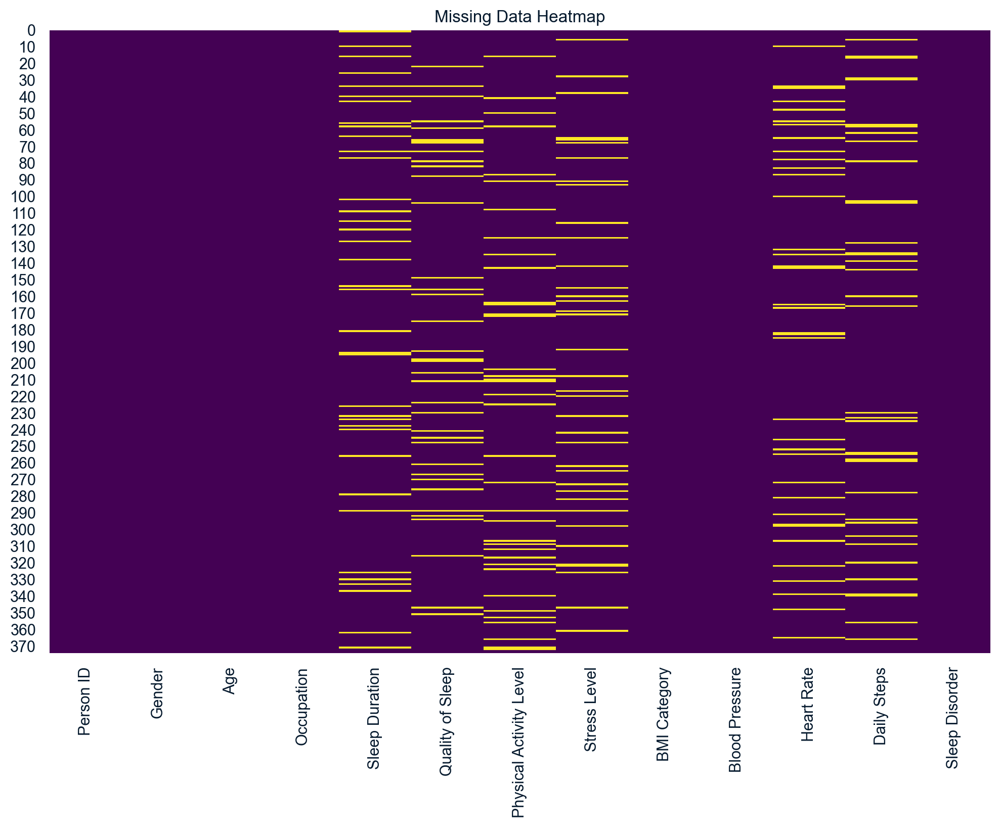

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer

# Visualize missing data patterns using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(sleep_data_with_missing.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Data Heatmap')
plt.show()

Imputation with mean for numerical columns

In [36]:
from sklearn.impute import SimpleImputer

# Mean Imputation
mean_imputer = SimpleImputer(strategy='mean')
sleep_data_mean_imputed = sleep_data_with_missing.copy()
sleep_data_mean_imputed[columns_with_missing] = mean_imputer.fit_transform(sleep_data_with_missing[columns_with_missing])

# Median Imputation
median_imputer = SimpleImputer(strategy='median')
sleep_data_median_imputed = sleep_data_with_missing.copy()
sleep_data_median_imputed[columns_with_missing] = median_imputer.fit_transform(sleep_data_with_missing[columns_with_missing])

# Delete Rows with Missing Values
sleep_data_dropped = sleep_data_with_missing.dropna()

# Display the first few rows of each imputed dataset
sleep_data_mean_imputed.head(), sleep_data_median_imputed.head(), sleep_data_dropped.head()

(   Person ID Gender  Age  ... Heart Rate  Daily Steps  Sleep Disorder
 0          1   Male   27  ...       77.0       4200.0            None
 1          2   Male   28  ...       75.0      10000.0            None
 2          3   Male   28  ...       75.0      10000.0            None
 3          4   Male   28  ...       85.0       3000.0     Sleep Apnea
 4          5   Male   28  ...       85.0       3000.0     Sleep Apnea
 
 [5 rows x 13 columns],
    Person ID Gender  Age  ... Heart Rate  Daily Steps  Sleep Disorder
 0          1   Male   27  ...       77.0       4200.0            None
 1          2   Male   28  ...       75.0      10000.0            None
 2          3   Male   28  ...       75.0      10000.0            None
 3          4   Male   28  ...       85.0       3000.0     Sleep Apnea
 4          5   Male   28  ...       85.0       3000.0     Sleep Apnea
 
 [5 rows x 13 columns],
    Person ID Gender  Age  ... Heart Rate  Daily Steps  Sleep Disorder
 1          2   Male   28

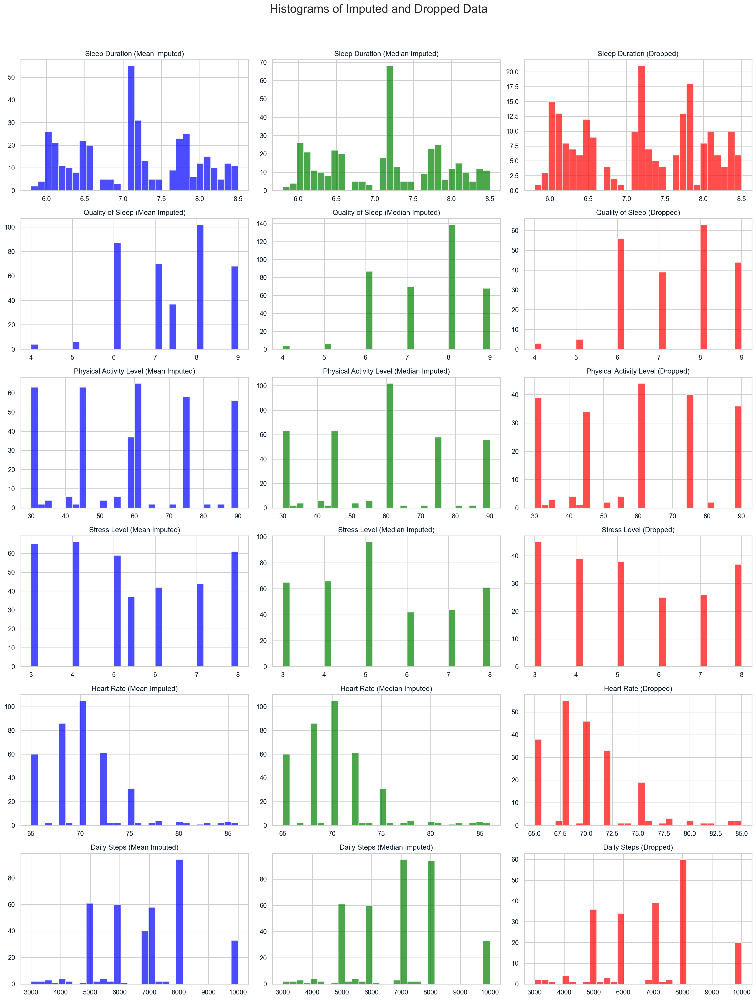

In [37]:
# Plot histograms for sleep_data_imputed_mean, sleep_data_imputed_median, and sleep_data_dropped

# Define the columns to plot
columns_to_plot = ["Sleep Duration", "Quality of Sleep", "Physical Activity Level", "Stress Level", "Heart Rate", "Daily Steps"]

# Set up the figure and axes
fig, axes = plt.subplots(len(columns_to_plot), 3, figsize=(18, 24))
fig.suptitle('Histograms of Imputed and Dropped Data', fontsize=20)

# Plot histograms for each column
for i, column in enumerate(columns_to_plot):
    # Histogram for sleep_data_imputed_mean
    axes[i, 0].hist(sleep_data_imputed_mean[column].dropna(), bins=30, color='blue', alpha=0.7)
    axes[i, 0].set_title(f'{column} (Mean Imputed)')
    
    # Histogram for sleep_data_imputed_median
    axes[i, 1].hist(sleep_data_imputed_median[column].dropna(), bins=30, color='green', alpha=0.7)
    axes[i, 1].set_title(f'{column} (Median Imputed)')
    
    # Histogram for sleep_data_dropped
    axes[i, 2].hist(sleep_data_dropped[column].dropna(), bins=30, color='red', alpha=0.7)
    axes[i, 2].set_title(f'{column} (Dropped)')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()